<a href="https://colab.research.google.com/github/VasilievNichita/IA_LABS/blob/main/Lab_6_IA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [14]:
!pip install ultralytics fiftyone -q
print("✅ Готово")

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.7/17.7 MB 88.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.8/43.8 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 140.6/140.6 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.8/112.8 kB 11.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.8/44.8 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.6/61.6 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.5/112.5 kB 12.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 74.8/74.8 kB 8.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 99.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.6/101.6 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 82.0 MB/s eta 0:00

In [15]:
import fiftyone as fo
import fiftyone.zoo as foz

# Open Images V7 — полностью публичный датасет, без логина
# Класс "Chess" — шахматные доски с фигурами, реальные фотографии
dataset = foz.load_zoo_dataset(
    "open-images-v7",
    split="validation",
    label_types=["detections"],
    classes=["Chess"],      # шахматная доска
    max_samples=20,
    only_matching=True,
)

print(f"✅ Загружено: {len(dataset)} изображений")
print(f"   Классы: {dataset.distinct('ground_truth.detections.label')}")

invalid escape sequence '\Z'


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/root/fiftyone/open-images-v7/validation' if necessary


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/validation/validation-images-with-rotation.csv' to '/root/fiftyone/open-images-v7/validation/metadata/image_ids.csv'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/class-descriptions-boxable.csv' to '/root/fiftyone/open-images-v7/validation/metadata/classes.csv'


Ignoring invalid classes ['Chess']
You can view the available classes via `fiftyone.utils.openimages.get_classes()`


You can view the available classes via `fiftyone.utils.openimages.get_classes()`


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/2018_04/bbox_labels_600_hierarchy.json' to '/tmp/tmpv2v4if2i/metadata/hierarchy.json'


INFO:fiftyone.utils.openimages:Downloading 'https://storage.googleapis.com/openimages/v5/validation-annotations-bbox.csv' to '/root/fiftyone/open-images-v7/validation/labels/detections.csv'


INFO:fiftyone.utils.openimages:Downloading 20 images


 100% |█████████████████████| 20/20 [3.2s elapsed, 0s remaining, 7.9 files/s]       


INFO:eta.core.utils: 100% |█████████████████████| 20/20 [3.2s elapsed, 0s remaining, 7.9 files/s]       


Dataset info written to '/root/fiftyone/open-images-v7/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/root/fiftyone/open-images-v7/info.json'


Loading 'open-images-v7' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'open-images-v7' split 'validation'


Ignoring invalid classes ['Chess']
You can view the available classes via `fiftyone.utils.openimages.get_classes()`


You can view the available classes via `fiftyone.utils.openimages.get_classes()`


 100% |███████████████████| 20/20 [36.9ms elapsed, 0s remaining, 542.2 samples/s]     


INFO:eta.core.utils: 100% |███████████████████| 20/20 [36.9ms elapsed, 0s remaining, 542.2 samples/s]     


Dataset 'open-images-v7-validation-20' created


INFO:fiftyone.zoo.datasets:Dataset 'open-images-v7-validation-20' created


✅ Загружено: 20 изображений
   Классы: []


In [16]:
from pathlib import Path
import glob

# Пути ко всем скачанным изображениям
test_images = [s.filepath for s in dataset]
print(f"🖼️  Изображений для работы: {len(test_images)}")
for p in test_images[:5]:
    print(f"   {Path(p).name}")

🖼️  Изображений для работы: 20
   0001eeaf4aed83f9.jpg
   000595fe6fee6369.jpg
   00075905539074f2.jpg
   0007cebe1b2ba653.jpg
   0007d6cf88afaa4a.jpg


In [17]:
from ultralytics import YOLO
import torch

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Устройство: {device}")

model = YOLO("yolov8m.pt")   # предобученная на COCO
print(f"✅ Модель загружена | классов: {len(model.names)}")

Устройство: cuda
✅ Модель загружена | классов: 80


In [18]:
results = model.predict(
    source=test_images,
    conf=0.25,
    device=device,
    verbose=False
)

from collections import Counter
total = sum(len(r.boxes) for r in results)
all_found = Counter(
    model.names[int(cls)]
    for r in results
    for cls in r.boxes.cls
)

print(f"✅ Обработано: {len(results)} изображений, найдено объектов: {total}")
print("\nЧто обнаружено:")
for cls, cnt in all_found.most_common():
    print(f"  {'█' * min(cnt, 30)} {cls} ({cnt})")

✅ Обработано: 20 изображений, найдено объектов: 76

Что обнаружено:
  █████████████████ apple (17)
  ████████████████ person (16)
  █████ airplane (5)
  █████ truck (5)
  █████ dog (5)
  ████ carrot (4)
  ███ tie (3)
  ███ bowl (3)
  ██ frisbee (2)
  ██ cup (2)
  ██ dining table (2)
  █ baseball bat (1)
  █ banana (1)
  █ fork (1)
  █ spoon (1)
  █ donut (1)
  █ car (1)
  █ bed (1)
  █ pizza (1)
  █ sandwich (1)
  █ motorcycle (1)
  █ bottle (1)
  █ book (1)


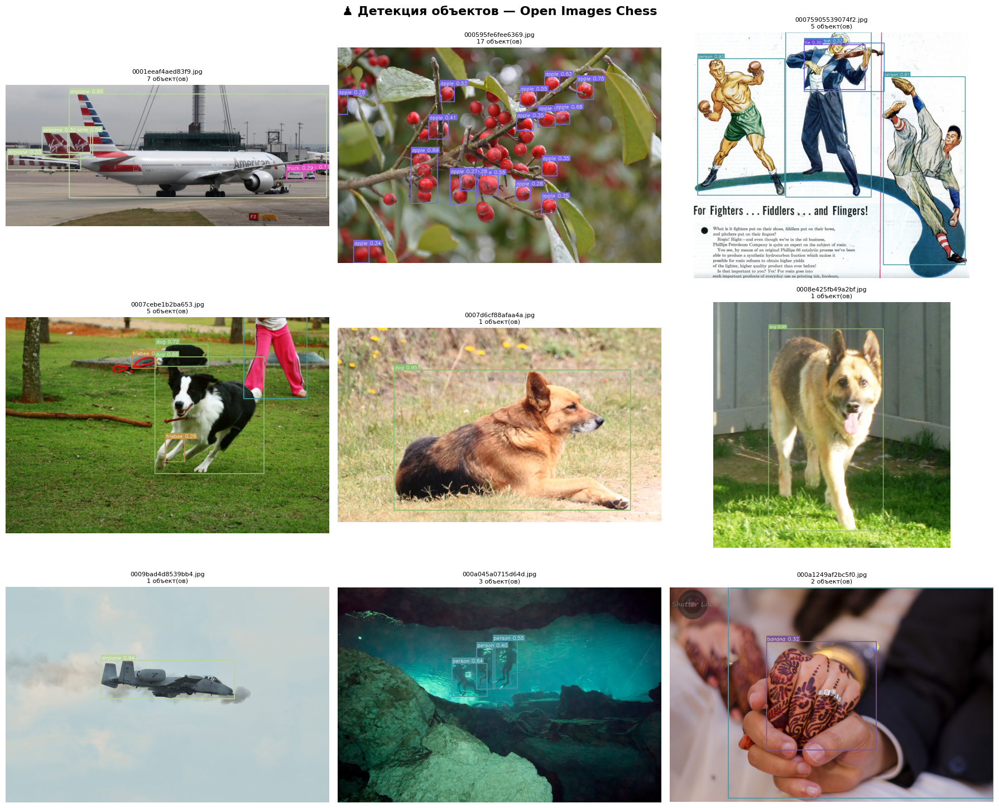

In [19]:
import cv2, numpy as np, matplotlib.pyplot as plt

np.random.seed(42)
COLORS = {name: tuple(np.random.randint(60,230,3).tolist())
          for name in model.names.values()}

def draw_boxes(bgr, result):
    img = bgr.copy()
    for box, cls, conf in zip(result.boxes.xyxy,
                               result.boxes.cls,
                               result.boxes.conf):
        x1,y1,x2,y2 = map(int, box)
        label = model.names[int(cls)]
        color = COLORS[label]
        cv2.rectangle(img,(x1,y1),(x2,y2),color,2)
        text = f"{label} {float(conf):.2f}"
        (tw,th),_ = cv2.getTextSize(text,cv2.FONT_HERSHEY_SIMPLEX,0.5,1)
        cv2.rectangle(img,(x1,y1-th-6),(x1+tw+4,y1),color,-1)
        cv2.putText(img,text,(x1+2,y1-3),
                    cv2.FONT_HERSHEY_SIMPLEX,0.5,(255,255,255),1)
    return img

n_show = min(9, len(test_images))
cols, rows = 3, (n_show + 2) // 3
fig, axes = plt.subplots(rows, cols, figsize=(18, rows*5))
fig.suptitle("♟️ Детекция объектов — Open Images Chess", fontsize=16, fontweight="bold")

for ax, path, res in zip(np.array(axes).flat,
                          test_images[:n_show],
                          results[:n_show]):
    bgr = cv2.imread(path)
    vis = draw_boxes(bgr, res)
    ax.imshow(cv2.cvtColor(vis, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{Path(path).name[:28]}\n{len(res.boxes)} объект(ов)", fontsize=8)
    ax.axis("off")

for ax in np.array(axes).flat[n_show:]:
    ax.axis("off")

plt.tight_layout()
plt.savefig("detection_chess.png", dpi=120, bbox_inches="tight")
plt.show()

In [20]:
global_cnt = Counter()
per_image  = []

for path, res in zip(test_images, results):
    found = [model.names[int(c)] for c in res.boxes.cls]
    cnt   = Counter(found)
    global_cnt += cnt
    per_image.append({"img": Path(path).name, "total": len(found), "detail": dict(cnt)})

print("=" * 62)
print("  ПОДСЧЁТ ОБЪЕКТОВ ПО ИЗОБРАЖЕНИЯМ")
print("=" * 62)
for s in per_image:
    print(f"  {s['img'][:35]:35s} [{s['total']:2d}]  {s['detail']}")

print("\n" + "=" * 62)
print("  ИТОГО ПО ВСЕМ ИЗОБРАЖЕНИЯМ")
print("=" * 62)
for cls, cnt in global_cnt.most_common():
    print(f"  {'█' * min(cnt,40)}  {cls} ({cnt})")

  ПОДСЧЁТ ОБЪЕКТОВ ПО ИЗОБРАЖЕНИЯМ
  0001eeaf4aed83f9.jpg                [ 7]  {'airplane': 4, 'truck': 3}
  000595fe6fee6369.jpg                [17]  {'apple': 17}
  00075905539074f2.jpg                [ 5]  {'person': 3, 'baseball bat': 1, 'tie': 1}
  0007cebe1b2ba653.jpg                [ 5]  {'person': 1, 'dog': 2, 'frisbee': 2}
  0007d6cf88afaa4a.jpg                [ 1]  {'dog': 1}
  0008e425fb49a2bf.jpg                [ 1]  {'dog': 1}
  0009bad4d8539bb4.jpg                [ 1]  {'airplane': 1}
  000a045a0715d64d.jpg                [ 3]  {'person': 3}
  000a1249af2bc5f0.jpg                [ 2]  {'person': 1, 'banana': 1}
  000ada55d36b4bcb.jpg                [ 6]  {'fork': 1, 'spoon': 1, 'carrot': 3, 'bowl': 1}
  000c4d66ce89aa69.jpg                [ 1]  {'dog': 1}
  00101a0160a05d31.jpg                [ 5]  {'donut': 1, 'person': 1, 'cup': 1, 'carrot': 1, 'dining table': 1}
  001083f05db4352b.jpg                [ 3]  {'car': 1, 'truck': 2}
  0010c714a5da358a.jpg                [ 1

Размываем классы: {'person'}


Glyph 127787 (\N{FOG}) missing from font(s) DejaVu Sans.
Glyph 127787 (\N{FOG}) missing from font(s) DejaVu Sans.
Glyph 127787 (\N{FOG}) missing from font(s) DejaVu Sans.


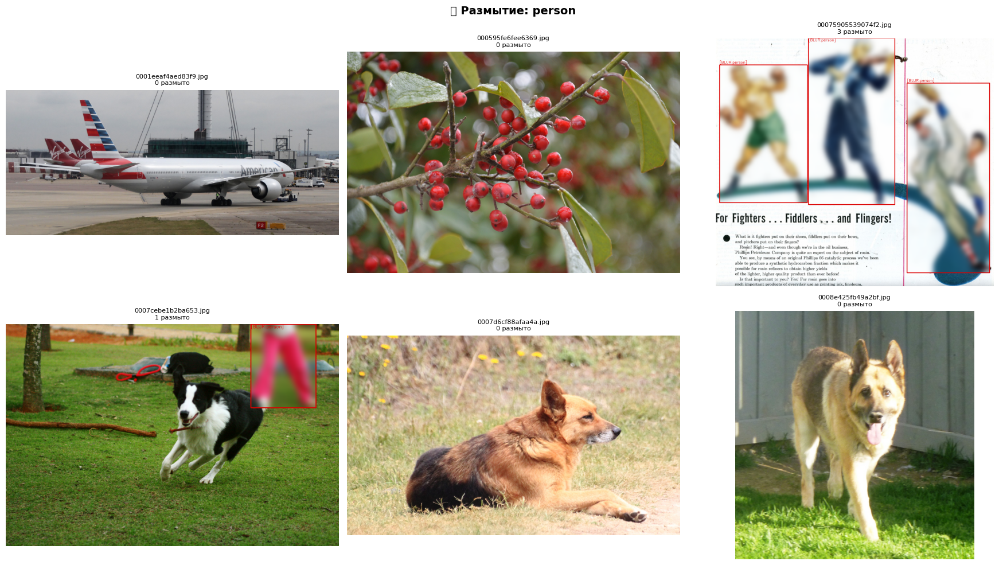

In [21]:
def blur_objects(bgr, result, targets, kernel=61):
    img = bgr.copy()
    k = kernel | 1
    for box, cls in zip(result.boxes.xyxy, result.boxes.cls):
        name = model.names[int(cls)]
        if name not in targets:
            continue
        x1,y1,x2,y2 = map(int, box)
        roi = img[y1:y2, x1:x2]
        if roi.size == 0: continue
        img[y1:y2, x1:x2] = cv2.GaussianBlur(roi, (k,k), 0)
        cv2.rectangle(img,(x1,y1),(x2,y2),(0,0,220),2)
        cv2.putText(img,f"[BLUR:{name}]",(x1,max(y1-5,12)),
                    cv2.FONT_HERSHEY_SIMPLEX,0.45,(0,0,220),1)
    return img

# Размываем людей (конфиденциальность) — самый частый класс
BLUR_TARGETS = {"person"}
# Если person нет — берём самый частый класс
if not global_cnt.get("person"):
    BLUR_TARGETS = {global_cnt.most_common(1)[0][0]}

print(f"Размываем классы: {BLUR_TARGETS}")

fig, axes = plt.subplots(2, 3, figsize=(18,10))
fig.suptitle(f"🌫️ Размытие: {', '.join(BLUR_TARGETS)}", fontsize=14, fontweight="bold")

for ax, path, res in zip(axes.flat, test_images[:6], results[:6]):
    bgr = cv2.imread(path)
    out = blur_objects(bgr, res, BLUR_TARGETS)
    n   = sum(1 for c in res.boxes.cls if model.names[int(c)] in BLUR_TARGETS)
    ax.imshow(cv2.cvtColor(out, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{Path(path).name[:28]}\n{n} размыто", fontsize=8)
    ax.axis("off")

plt.tight_layout()
plt.savefig("blur_chess.png", dpi=120, bbox_inches="tight")
plt.show()

Показываем только: {'person', 'airplane', 'apple'}


Glyph 127991 (\N{LABEL}) missing from font(s) DejaVu Sans.
Glyph 127991 (\N{LABEL}) missing from font(s) DejaVu Sans.
Glyph 127991 (\N{LABEL}) missing from font(s) DejaVu Sans.


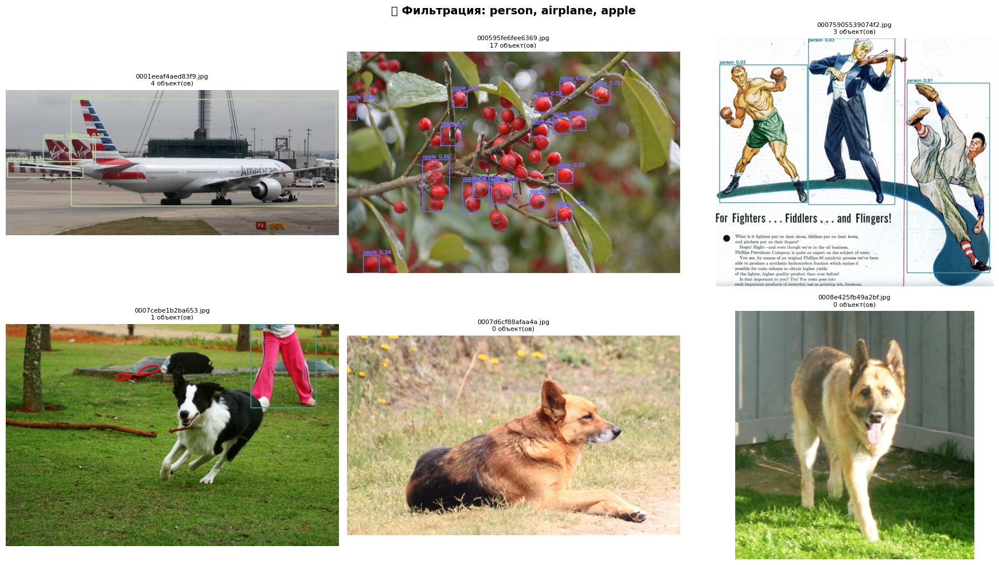

In [22]:
# Берём топ-3 самых частых класса и показываем только их
TOP3 = {cls for cls,_ in global_cnt.most_common(3)}
print(f"Показываем только: {TOP3}")

fig, axes = plt.subplots(2, 3, figsize=(18,10))
fig.suptitle(f"🏷️ Фильтрация: {', '.join(TOP3)}", fontsize=14, fontweight="bold")

for ax, path, res in zip(axes.flat, test_images[:6], results[:6]):
    img  = cv2.imread(path).copy()
    kept = 0
    for box, cls, conf in zip(res.boxes.xyxy, res.boxes.cls, res.boxes.conf):
        name = model.names[int(cls)]
        if name not in TOP3: continue
        x1,y1,x2,y2 = map(int, box)
        color = COLORS[name]
        cv2.rectangle(img,(x1,y1),(x2,y2),color,2)
        cv2.putText(img,f"{name} {float(conf):.2f}",(x1,max(y1-5,12)),
                    cv2.FONT_HERSHEY_SIMPLEX,0.5,color,2)
        kept += 1
    ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{Path(path).name[:28]}\n{kept} объект(ов)", fontsize=8)
    ax.axis("off")

plt.tight_layout()
plt.savefig("filter_chess.png", dpi=120, bbox_inches="tight")
plt.show()

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.


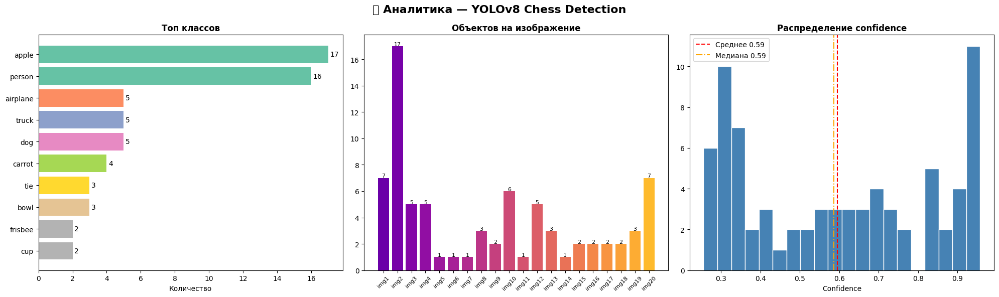

In [23]:
all_conf = np.array([float(c) for r in results for c in r.boxes.conf])
total_det = sum(s["total"] for s in per_image)

fig, axes = plt.subplots(1, 3, figsize=(20,6))
fig.suptitle("📊 Аналитика — YOLOv8 Chess Detection", fontsize=16, fontweight="bold")

# 1. Топ классов
ax1 = axes[0]
top = global_cnt.most_common(10)
if top:
    lbls, cnts = zip(*top)
    bars = ax1.barh(lbls, cnts, color=plt.cm.Set2(np.linspace(0,1,len(lbls))))
    for b,c in zip(bars,cnts):
        ax1.text(b.get_width()+.1, b.get_y()+b.get_height()/2, str(c), va="center")
    ax1.invert_yaxis()
ax1.set_title("Топ классов", fontweight="bold")
ax1.set_xlabel("Количество")

# 2. Объектов на фото
ax2 = axes[1]
tots = [s["total"] for s in per_image]
clrs = plt.cm.plasma(np.linspace(0.2,0.85,len(tots)))
b2   = ax2.bar([f"img{i+1}" for i in range(len(tots))], tots, color=clrs)
ax2.set_xticklabels([f"img{i+1}" for i in range(len(tots))], rotation=45, fontsize=8)
for b,c in zip(b2,tots):
    ax2.text(b.get_x()+b.get_width()/2, b.get_height()+.05, str(c), ha="center", fontsize=8)
ax2.set_title("Объектов на изображение", fontweight="bold")

# 3. Confidence
ax3 = axes[2]
if len(all_conf):
    ax3.hist(all_conf, bins=20, color="steelblue", edgecolor="white")
    ax3.axvline(all_conf.mean(),      color="red",    ls="--", label=f"Среднее {all_conf.mean():.2f}")
    ax3.axvline(np.median(all_conf),  color="orange", ls="-.", label=f"Медиана {np.median(all_conf):.2f}")
    ax3.legend()
ax3.set_title("Распределение confidence", fontweight="bold")
ax3.set_xlabel("Confidence")

plt.tight_layout()
plt.savefig("analytics.png", dpi=120, bbox_inches="tight")
plt.show()

In [25]:
high = (all_conf >= 0.70).sum() if len(all_conf) else 0
low  = (all_conf <  0.50).sum() if len(all_conf) else 0
n    = max(len(all_conf), 1)

print("=" * 62)
print("  ИТОГОВЫЙ АНАЛИЗ РАБОТЫ МОДЕЛИ")
print("=" * 62)
print(f"  Изображений обработано     : {len(results)}")
print(f"  Всего детекций             : {total_det}")
print(f"  Среднее объектов / картинку: {total_det/len(results):.1f}")
print(f"  Уникальных классов         : {len(global_cnt)}")
print(f"  Уверенность ≥ 0.70         : {high} ({100*high/n:.1f}%)")
print(f"  Уверенность < 0.50         : {low}  ({100*low/n:.1f}%)")
if len(all_conf): print(f"  Средняя уверенность        : {all_conf.mean():.3f}")

print()
print("  ЧТО РАСПОЗНАЁТСЯ ХОРОШО:")
for cls, cnt in global_cnt.most_common(4):
    confs = [float(c) for r in results
             for c,cl in zip(r.boxes.conf,r.boxes.cls)
             if model.names[int(cl)]==cls]
    print(f"  • {cls:20s}: {cnt} det, conf_avg={np.mean(confs):.2f}")

print()
print("  ОШИБКИ И ОГРАНИЧЕНИЯ:")
rare = [c for c,n_ in global_cnt.items() if n_==1]
print(f"  • Редкие классы (1 det): {rare[:5]}")
print(f"  • Conf<0.5: {low} шт. — возможные ложные срабатывания")
print(f"  • Перекрытые объекты и нестандартные ракурсы")

print()
print("  ПРИМЕНИМОСТЬ:")
print("  Наблюдение и анализ шахматных партий по фото")
print("  Автоматическая запись ходов через камеру")
print("  Для специфичных фигур нужно дообучение")

  ИТОГОВЫЙ АНАЛИЗ РАБОТЫ МОДЕЛИ
  Изображений обработано     : 20
  Всего детекций             : 76
  Среднее объектов / картинку: 3.8
  Уникальных классов         : 23
  Уверенность ≥ 0.70         : 29 (38.2%)
  Уверенность < 0.50         : 31  (40.8%)
  Средняя уверенность        : 0.595

  ЧТО РАСПОЗНАЁТСЯ ХОРОШО:
  • apple               : 17 det, conf_avg=0.47
  • person              : 16 det, conf_avg=0.80
  • airplane            : 5 det, conf_avg=0.60
  • truck               : 5 det, conf_avg=0.51

  ОШИБКИ И ОГРАНИЧЕНИЯ:
  • Редкие классы (1 det): ['baseball bat', 'banana', 'fork', 'spoon', 'donut']
  • Conf<0.5: 31 шт. — возможные ложные срабатывания
  • Перекрытые объекты и нестандартные ракурсы

  ПРИМЕНИМОСТЬ:
  Наблюдение и анализ шахматных партий по фото
  Автоматическая запись ходов через камеру
  Для специфичных фигур нужно дообучение
